LIBRERIAS Y DATOS

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, Input
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns

# Configurar TensorFlow para usar solo la CPU
#os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

# Define el directorio de la base de datos
directorio = r'C:/Users/joshu/Downloads/JAFFE/JAFFE/jaffedbase/jaffedbase'

# Define el mapeo de emociones a etiquetas numéricas
emociones = {
    'NE': 0,  # Neutral
    'HA': 1,  # Happy
    'SA': 2,  # Sad
    'SU': 3,  # Surprise
    'AN': 4,  # Angry
    'DI': 5,  # Disgust
    'FE': 6   # Fear
}

contenido = os.listdir(directorio)
imagenes = [nombre for nombre in contenido if nombre.endswith('.tiff')]
imagenes_data = []
etiquetas = []

# Cargar imágenes y etiquetas
for nombre_imagen in imagenes:
    partes = nombre_imagen.split('.')
    codigo_emocion = partes[1][:2]  
    etiqueta = emociones.get(codigo_emocion, -1)  # -1 para emociones no definidas
    etiquetas.append(etiqueta)
    
    ruta_imagen = os.path.join(directorio, nombre_imagen)
    imagen_actual = cv2.imread(ruta_imagen, cv2.IMREAD_GRAYSCALE)
    imagen_actual = cv2.resize(imagen_actual, (224, 224))
    imagen_rgb = cv2.cvtColor(imagen_actual, cv2.COLOR_GRAY2RGB)
    imagen_rgb = imagen_rgb / 255.0  # Normalizar
    imagenes_data.append(imagen_rgb)

imagenes_data = np.array(imagenes_data)
etiquetas = np.array(etiquetas)

# Separar los datos en conjuntos de entrenamiento y validación
imagenes_train, imagenes_val, etiquetas_train, etiquetas_val = train_test_split(
    imagenes_data, etiquetas, test_size=0.2, random_state=42
)

MODELO HIBRIDO

In [5]:
from tensorflow.keras import layers, models, Input

# Definir la entrada
inputs = Input(shape=(224, 224, 3))

# Bloque de convoluciones separables en profundidad (inspirado en MobileNet)
def depthwise_separable_conv(x, filters, kernel_size=(3, 3), strides=(1, 1)):
    x = layers.DepthwiseConv2D(kernel_size, strides=strides, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, (1, 1), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x

# Primeras capas convolucionales (inspiradas en VGG16)
x = layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same', activation=None)(inputs)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D((2, 2))(x)

# Aplicar un bloque de convoluciones separables en profundidad (MobileNet)
x = depthwise_separable_conv(x, filters=64)
x = layers.MaxPooling2D((2, 2))(x)

# **Eliminado**: Bloque redundante de convoluciones separables y denso simplificado.

# Nueva capa convolucional para capturar más características útiles
x = layers.Conv2D(128, (3, 3), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D((2, 2))(x)

# Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

# Capas finales con Dropout para evitar sobreajuste
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(7, activation='softmax')(x)

# Construcción final del modelo
model = models.Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9),
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])


# Implementar EarlyStopping y reducción de learning rate en Plateau
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=10, min_lr=1e-6)

# Ajuste del batch size para mejorar estabilidad en validación
history = model.fit(imagenes_train, etiquetas_train, 
                    validation_data=(imagenes_val, etiquetas_val), 
                    epochs=2000, 
                    batch_size=8,  # Batch size ajustado
                    callbacks=[early_stopping, reduce_lr])


Epoch 1/2000
22/22 [==============================] - 1s 27ms/step - loss: 2.0975 - accuracy: 0.1294 - val_loss: 1.9422 - val_accuracy: 0.1395 - lr: 0.0010
Epoch 2/2000
22/22 [==============================] - 0s 17ms/step - loss: 2.0764 - accuracy: 0.1412 - val_loss: 1.9405 - val_accuracy: 0.1628 - lr: 0.0010
Epoch 3/2000
22/22 [==============================] - 0s 18ms/step - loss: 2.0337 - accuracy: 0.1059 - val_loss: 1.9416 - val_accuracy: 0.1628 - lr: 0.0010
Epoch 4/2000
22/22 [==============================] - 0s 17ms/step - loss: 2.0184 - accuracy: 0.1235 - val_loss: 1.9393 - val_accuracy: 0.1628 - lr: 0.0010
Epoch 5/2000
22/22 [==============================] - 0s 18ms/step - loss: 1.9416 - accuracy: 0.1941 - val_loss: 1.9401 - val_accuracy: 0.1628 - lr: 0.0010
Epoch 6/2000
22/22 [==============================] - 0s 17ms/step - loss: 2.0391 - accuracy: 0.1353 - val_loss: 1.9384 - val_accuracy: 0.1628 - lr: 0.0010
Epoch 7/2000
22/22 [==============================] - 0s 17ms/st

Graficar

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 32)      896       
                                                                 
 batch_normalization_4 (Batc  (None, 112, 112, 32)     128       
 hNormalization)                                                 
                                                                 
 re_lu_4 (ReLU)              (None, 112, 112, 32)      0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                             
                                                                 
 depthwise_conv2d_1 (Depthwi  (None, 56, 56, 32)       320 

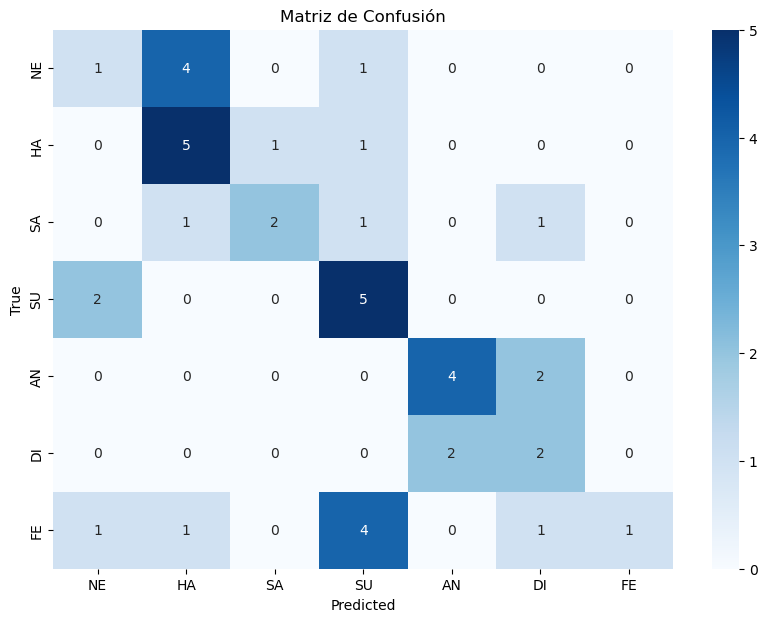

              precision    recall  f1-score   support

          NE       0.25      0.17      0.20         6
          HA       0.45      0.71      0.56         7
          SA       0.67      0.40      0.50         5
          SU       0.42      0.71      0.53         7
          AN       0.67      0.67      0.67         6
          DI       0.33      0.50      0.40         4
          FE       1.00      0.12      0.22         8

    accuracy                           0.47        43
   macro avg       0.54      0.47      0.44        43
weighted avg       0.56      0.47      0.43        43



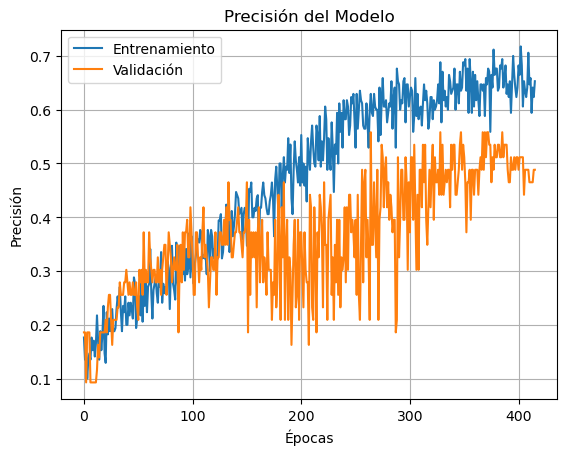

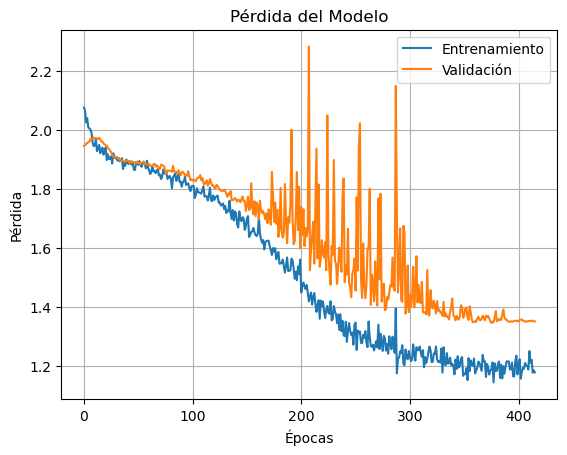

In [4]:
# Resumen del modelo
model.summary()

# Evaluar el modelo en el conjunto de validación
etiquetas_pred = np.argmax(model.predict(imagenes_val), axis=1)

# Generar la matriz de confusión
cm = confusion_matrix(etiquetas_val, etiquetas_pred)

# Visualizar la matriz de confusión
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=emociones.keys(), 
            yticklabels=emociones.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Matriz de Confusión')
plt.show()

# Mostrar el reporte de clasificación
print(classification_report(etiquetas_val, etiquetas_pred, target_names=emociones.keys()))

# Graficar los resultados de entrenamiento
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.grid()
plt.title('Precisión del Modelo')
plt.ylabel('Precisión')
plt.xlabel('Épocas')
plt.legend(['Entrenamiento', 'Validación'])
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.title('Pérdida del Modelo')
plt.ylabel('Pérdida')
plt.xlabel('Épocas')
plt.legend(['Entrenamiento', 'Validación'])
plt.show()

1/1 [==============================] - 0s 210ms/step
Visualizando activaciones para la capa: input_1


C:\Users\joshu\AppData\Local\Temp\ipykernel_7312\3114348244.py:51: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
c:\Users\joshu\anaconda3\envs\SuperBoop\lib\site-packages\matplotlib\_tight_bbox.py:67: RuntimeWarning: divide by zero encountered in double_scalars
  fig.patch.set_bounds(x0 / w1, y0 / h1,
c:\Users\joshu\anaconda3\envs\SuperBoop\lib\site-packages\matplotlib\_tight_bbox.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  fig.bbox.width / w1, fig.bbox.height / h1)
c:\Users\joshu\anaconda3\envs\SuperBoop\lib\site-packages\matplotlib\patches.py:743: RuntimeWarning: invalid value encountered in double_scalars
  y1 = self.convert_yunits(self._y0 + self._height)
c:\Users\joshu\anaconda3\envs\SuperBoop\lib\site-packages\matplotlib\transforms.py:2039: RuntimeWarning: invalid value encountered in double_scalars
  self._mtx[1, 2] += ty


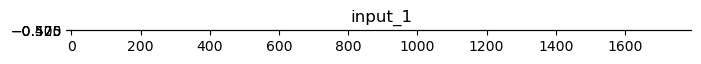

Visualizando activaciones para la capa: conv2d


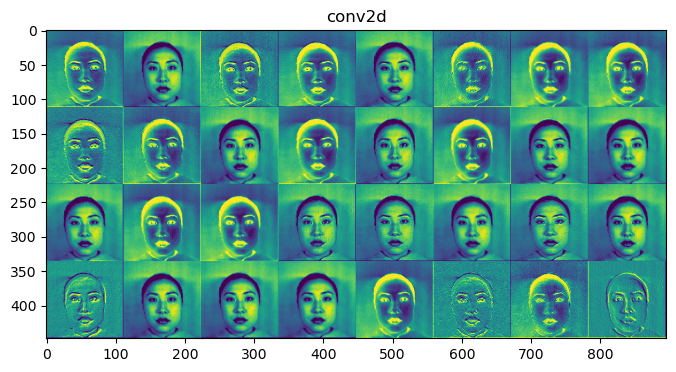

Visualizando activaciones para la capa: batch_normalization


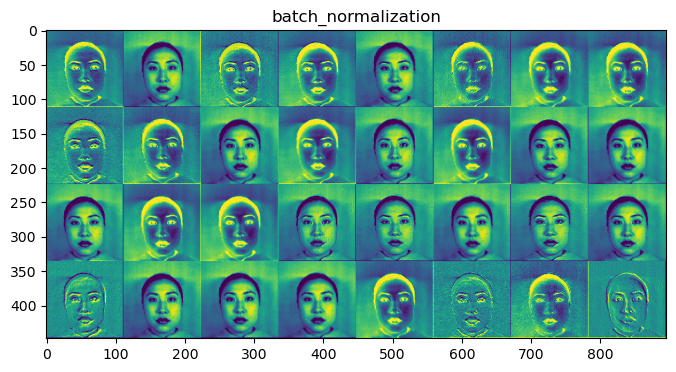

Visualizando activaciones para la capa: re_lu


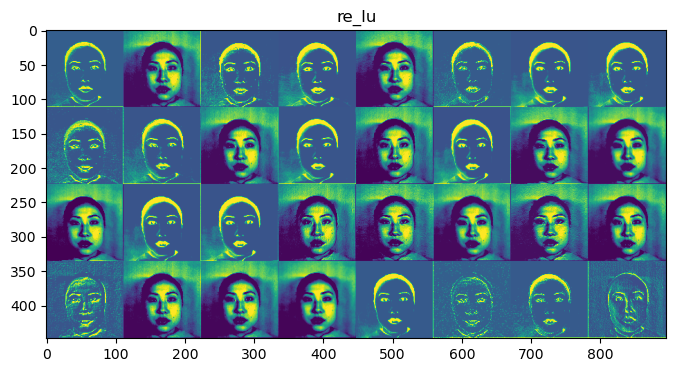

Visualizando activaciones para la capa: max_pooling2d


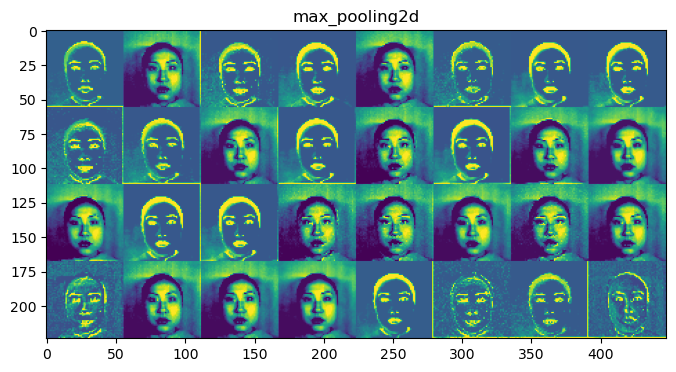

Visualizando activaciones para la capa: depthwise_conv2d


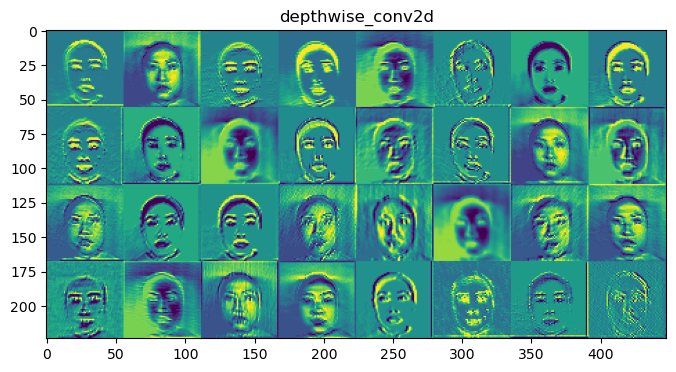

Visualizando activaciones para la capa: batch_normalization_1


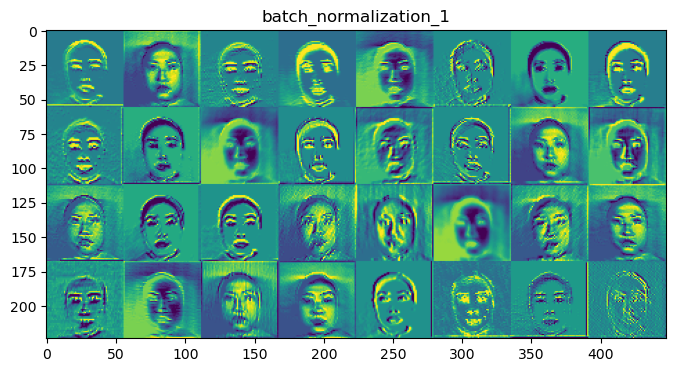

Visualizando activaciones para la capa: re_lu_1


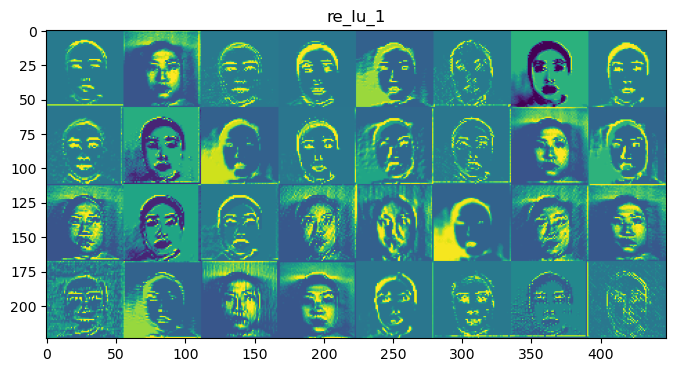

Visualizando activaciones para la capa: conv2d_1


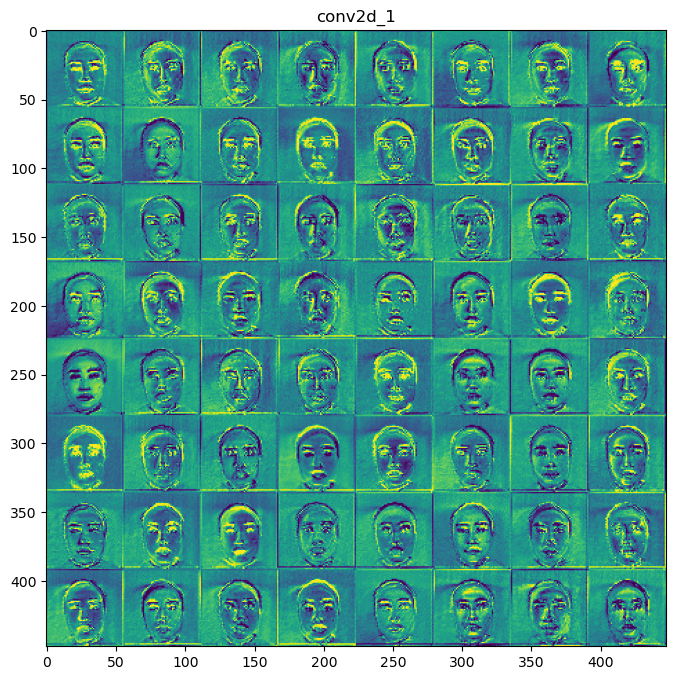

Visualizando activaciones para la capa: batch_normalization_2


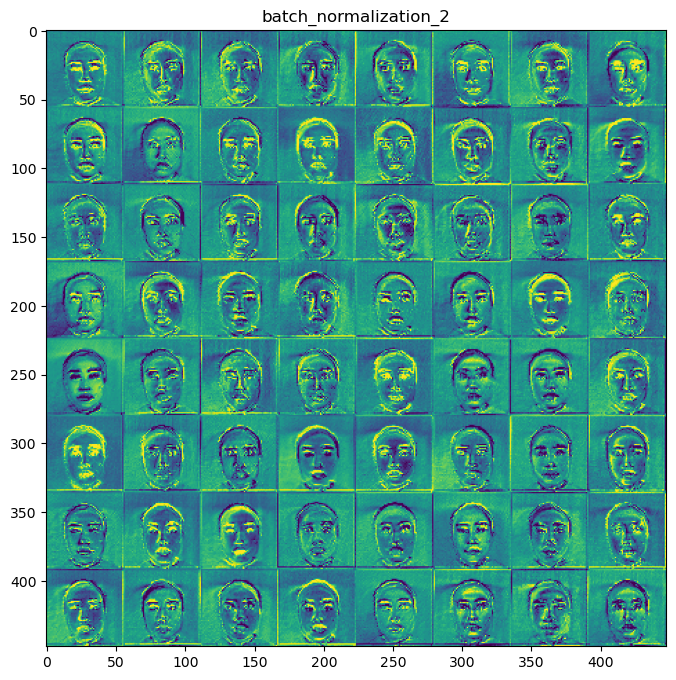

Visualizando activaciones para la capa: re_lu_2


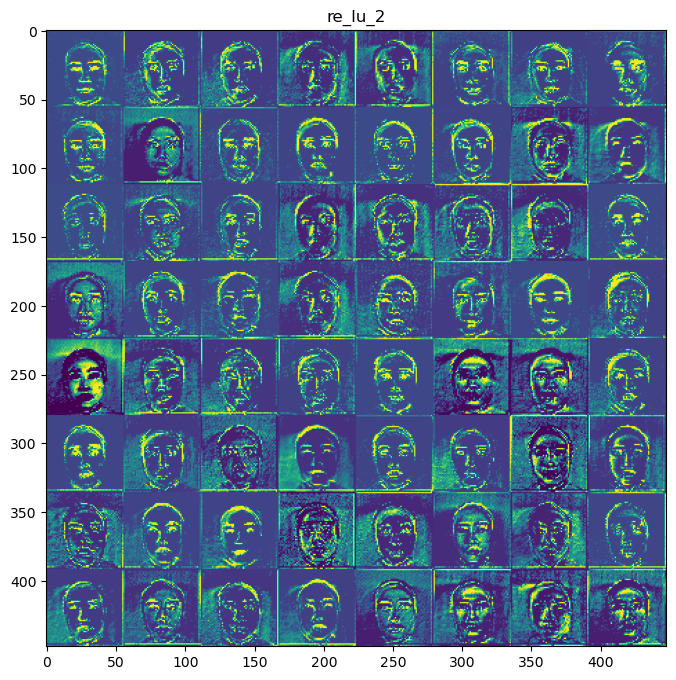

Visualizando activaciones para la capa: max_pooling2d_1


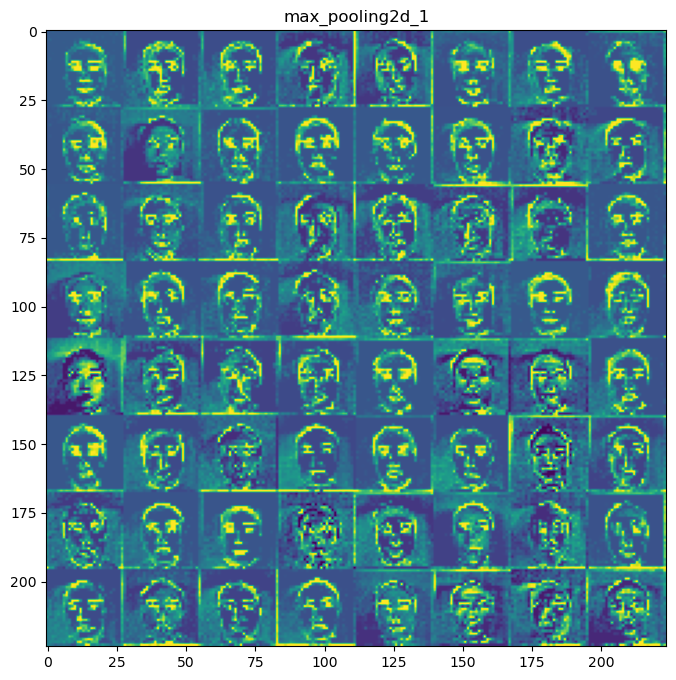

Visualizando activaciones para la capa: conv2d_2


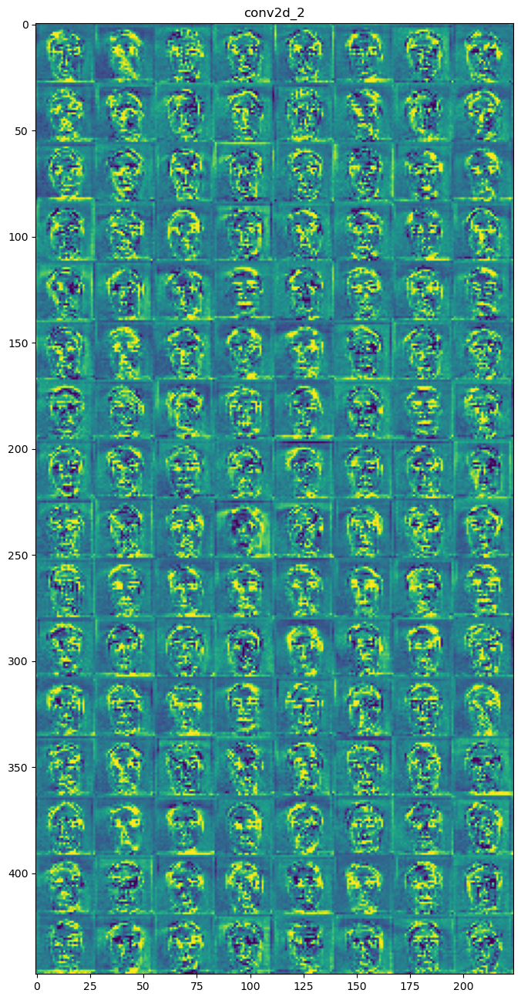

Visualizando activaciones para la capa: batch_normalization_3


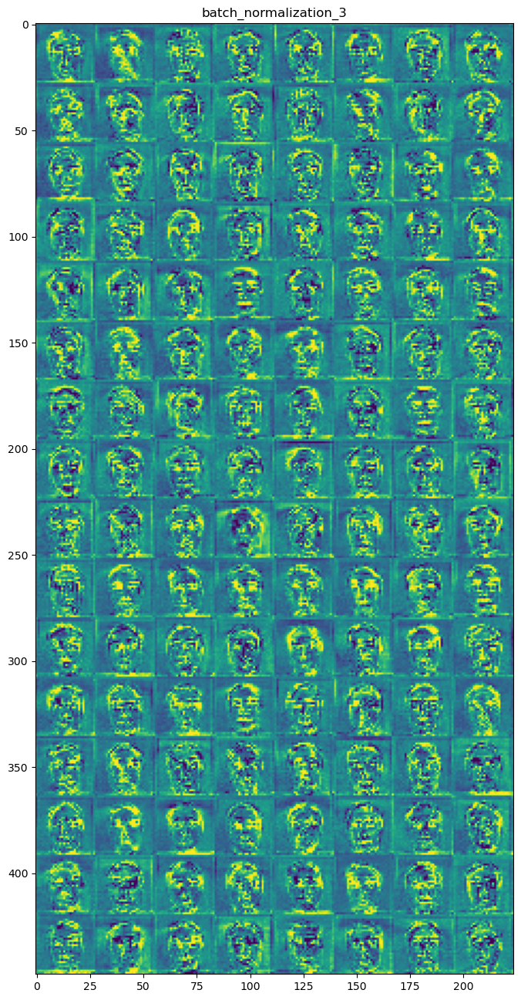

Visualizando activaciones para la capa: re_lu_3


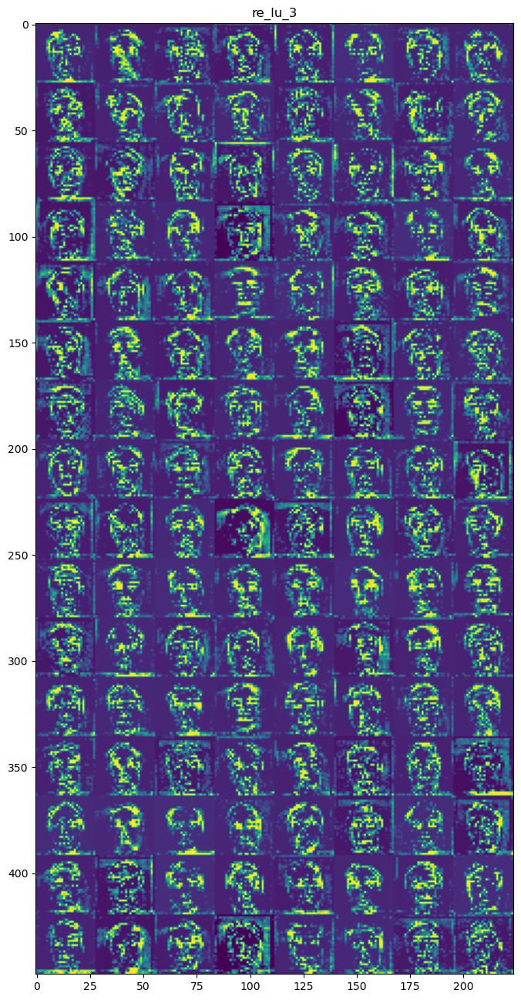

Visualizando activaciones para la capa: max_pooling2d_2


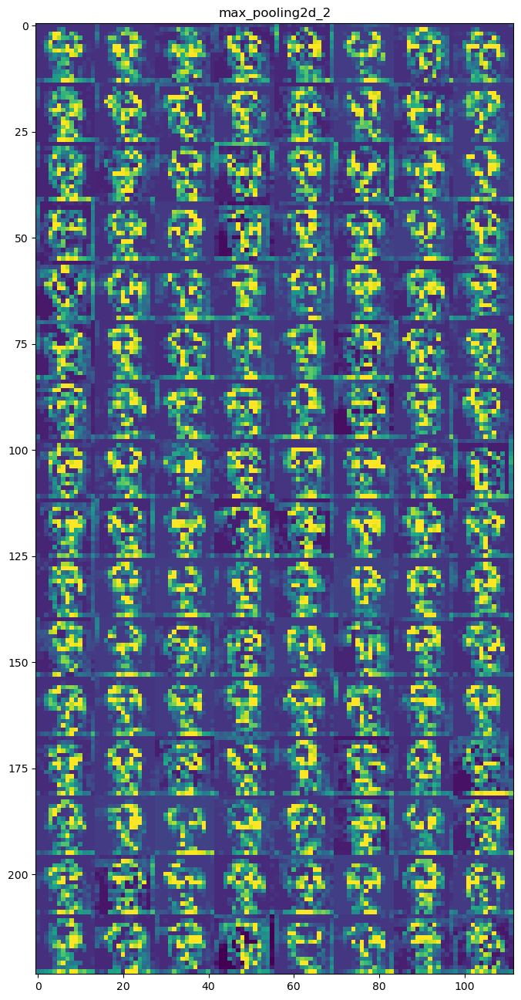

Visualizando activaciones para la capa: global_average_pooling2d


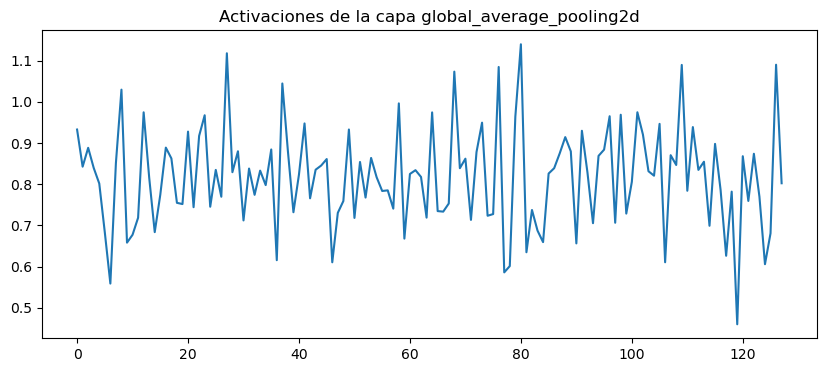

Visualizando activaciones para la capa: dense


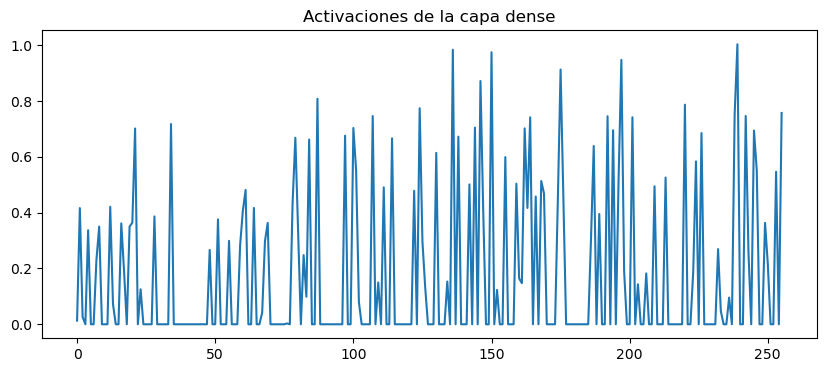

Visualizando activaciones para la capa: dropout


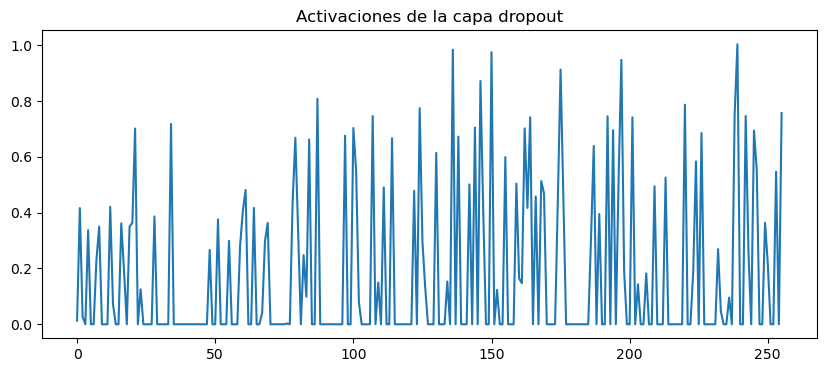

Visualizando activaciones para la capa: dense_1


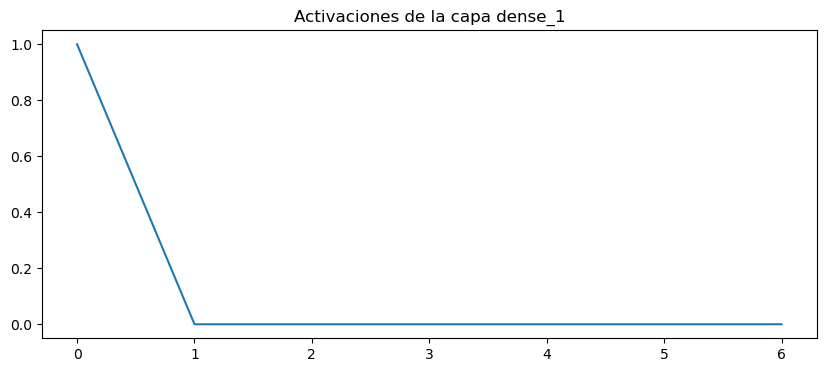

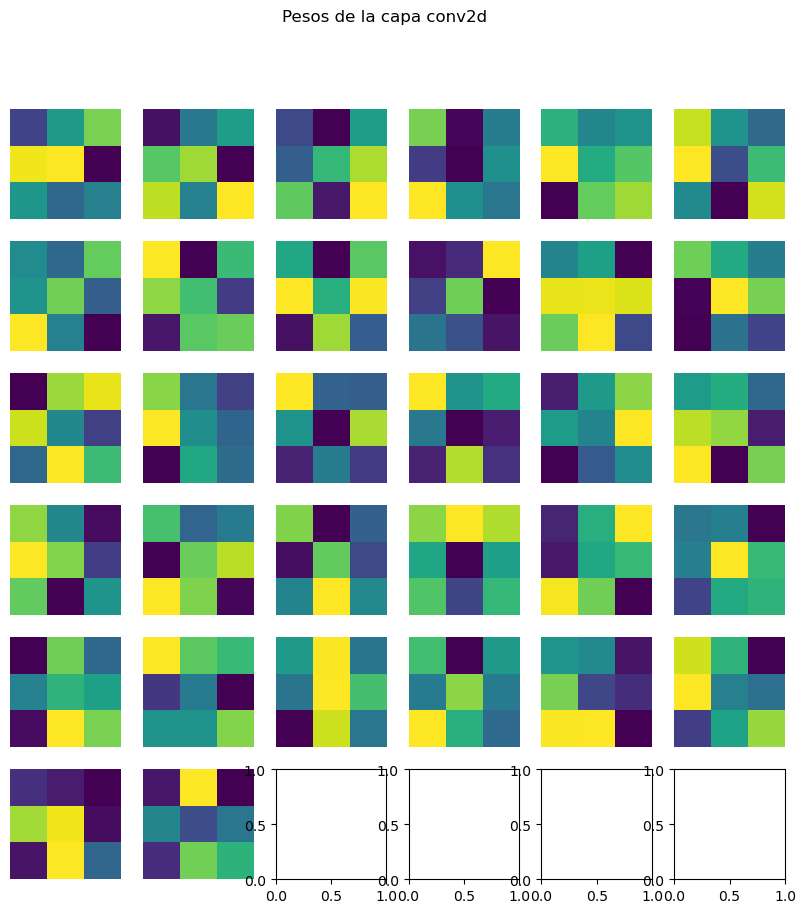

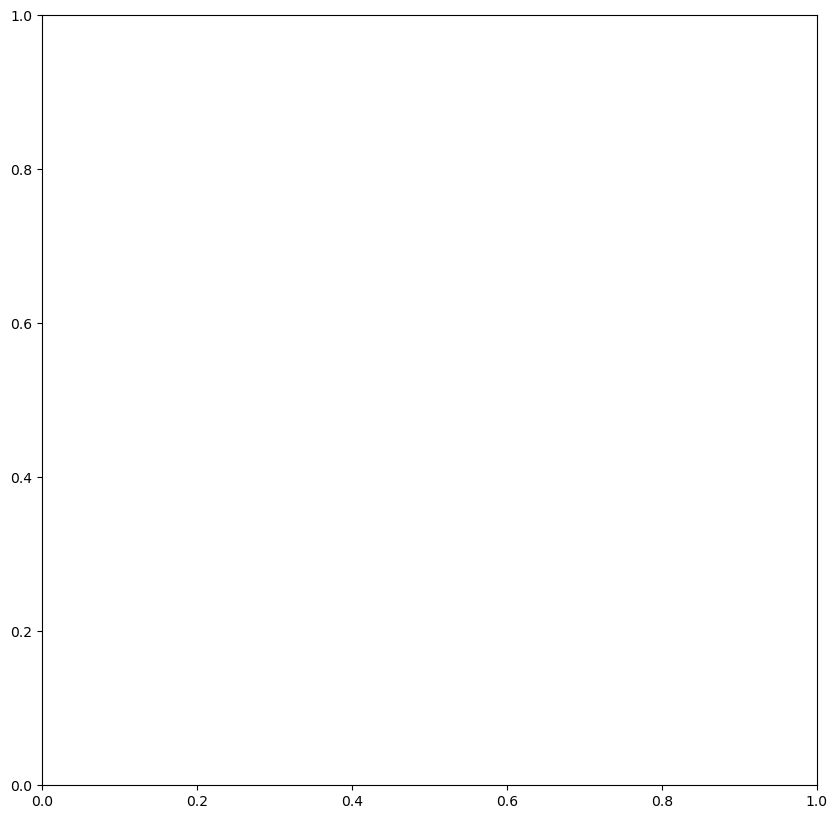

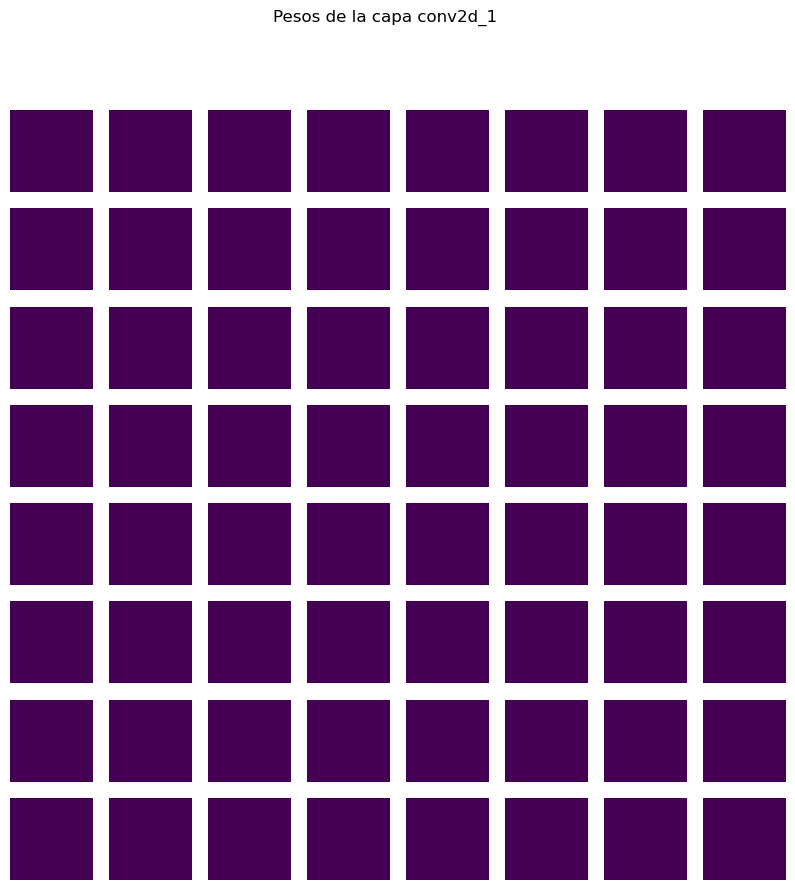

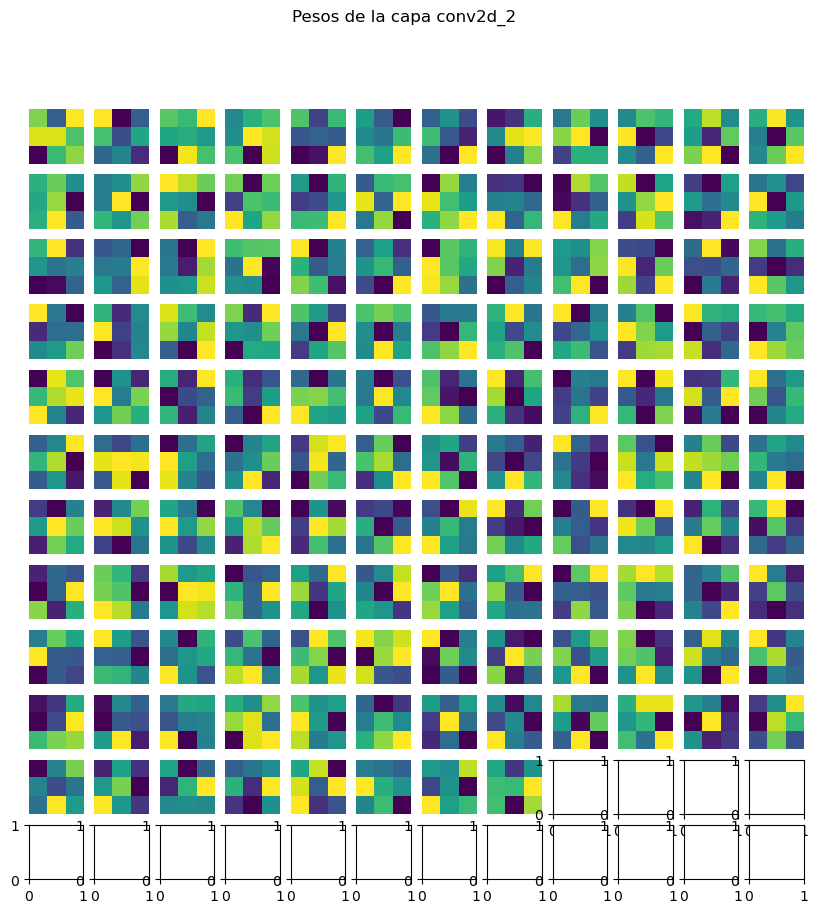

No se pueden calcular los pesos para la capa input_1: not enough values to unpack (expected 2, got 0)
Capa: conv2d
  Media: 0.003217884339392185
  Varianza: 0.0072145662270486355
  Asimetría: -0.001975387809065987
  Curtosis: -1.0367464292831354
  Entropía: -1181.838770008048
  Rango: 0.39533406496047974


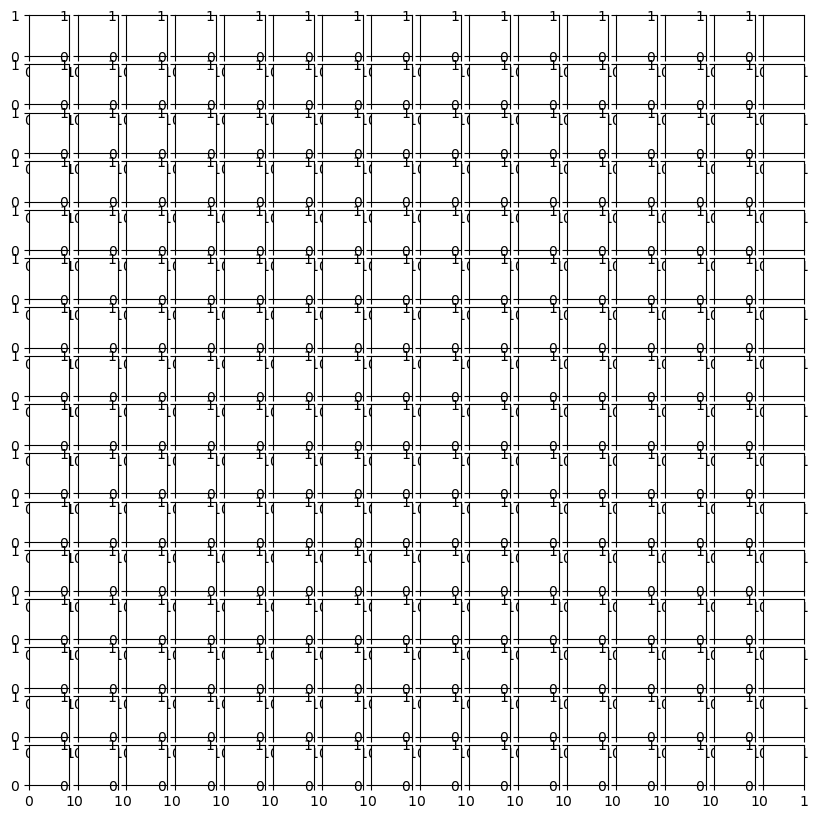

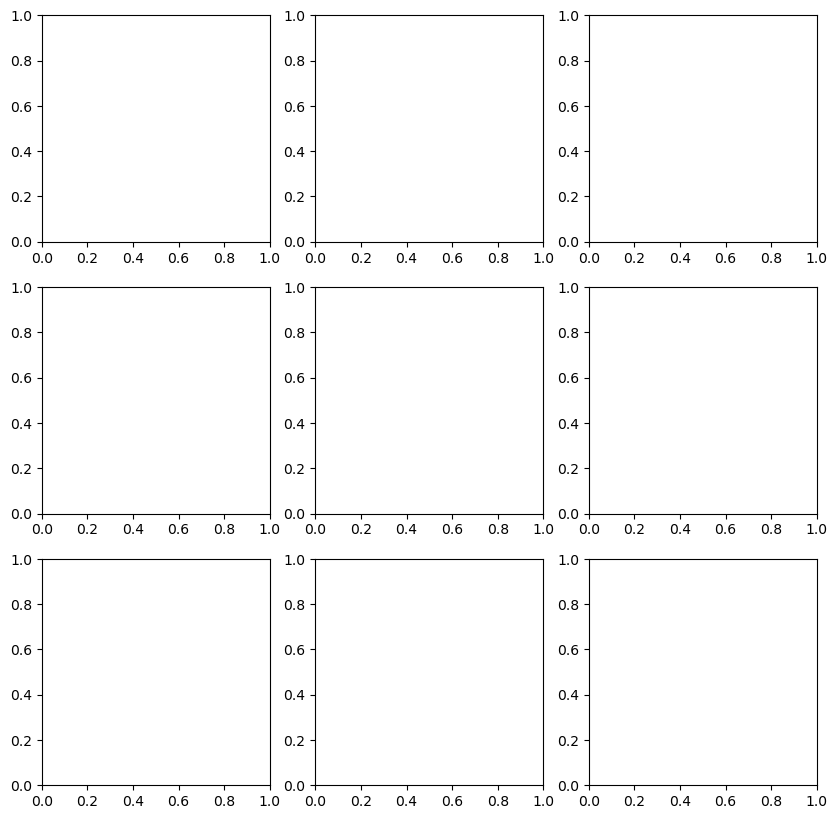

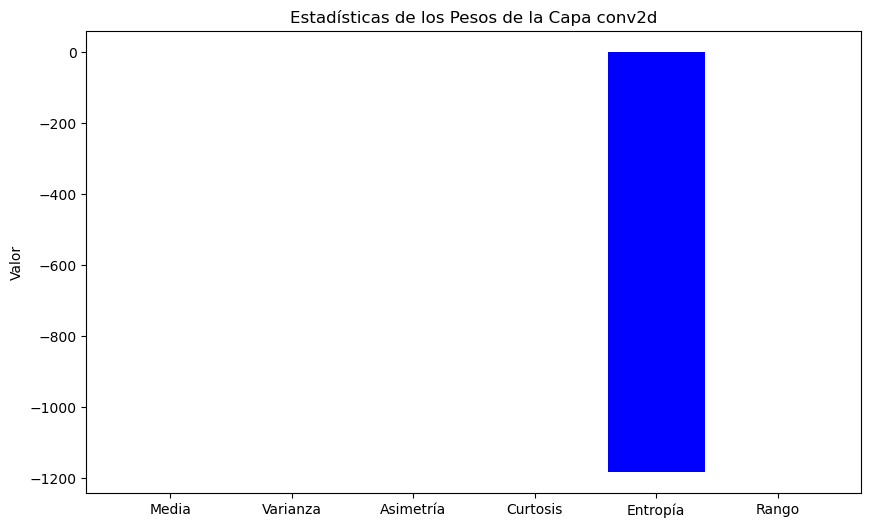

No se pueden calcular los pesos para la capa batch_normalization: too many values to unpack (expected 2)
No se pueden calcular los pesos para la capa re_lu: not enough values to unpack (expected 2, got 0)
No se pueden calcular los pesos para la capa max_pooling2d: not enough values to unpack (expected 2, got 0)
Capa: depthwise_conv2d
  Media: -0.00030362853431142867
  Varianza: 0.007321416400372982
  Asimetría: 0.09398990844224954
  Curtosis: -0.973548747090422
  Entropía: -1502.9140952674197
  Rango: 0.3739170432090759


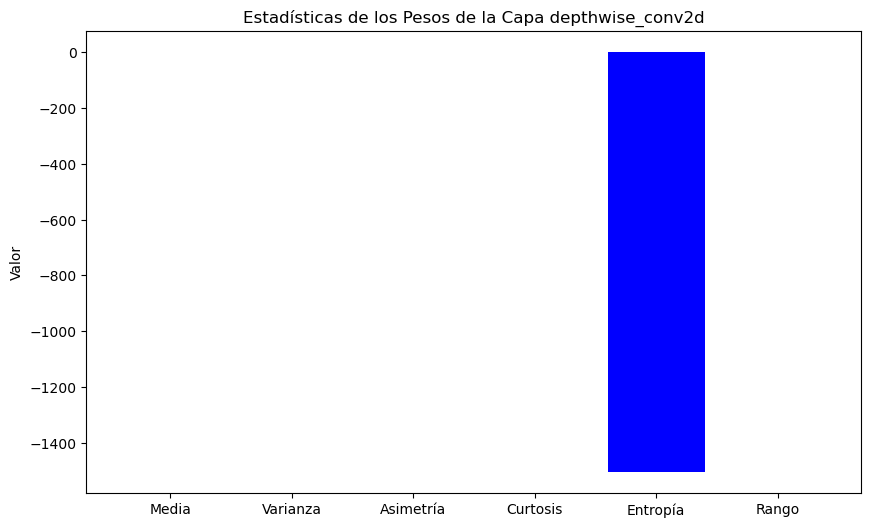

No se pueden calcular los pesos para la capa batch_normalization_1: too many values to unpack (expected 2)
No se pueden calcular los pesos para la capa re_lu_1: not enough values to unpack (expected 2, got 0)
Capa: conv2d_1
  Media: -0.004687323234975338
  Varianza: 0.02149869315326214
  Asimetría: -0.04249203237546893
  Curtosis: -0.9587780836695794
  Entropía: -327.5411211410767
  Rango: 0.6983330249786377


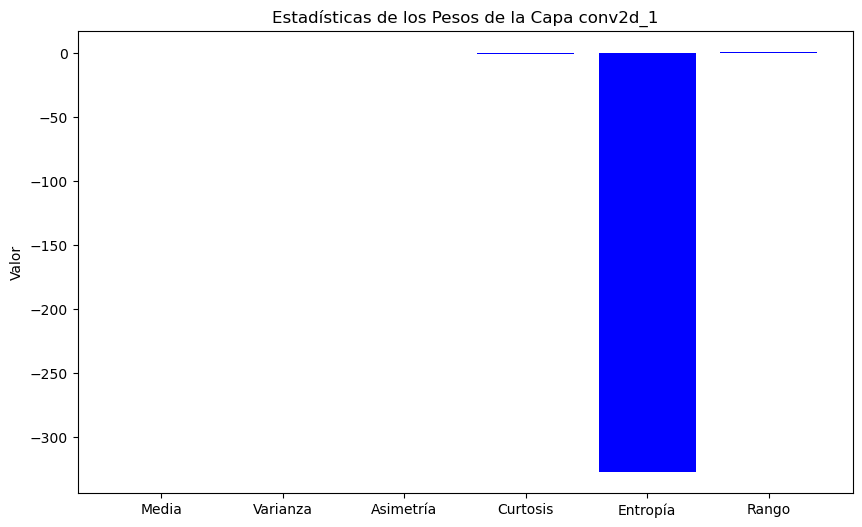

No se pueden calcular los pesos para la capa batch_normalization_2: too many values to unpack (expected 2)
No se pueden calcular los pesos para la capa re_lu_2: not enough values to unpack (expected 2, got 0)
No se pueden calcular los pesos para la capa max_pooling2d_1: not enough values to unpack (expected 2, got 0)
Capa: conv2d_2
  Media: 0.0007333913818001747
  Varianza: 0.001949785859324038
  Asimetría: -0.017146589575697587
  Curtosis: -0.04664436735296951
  Entropía: -1567.1516988818798
  Rango: 0.40140849351882935


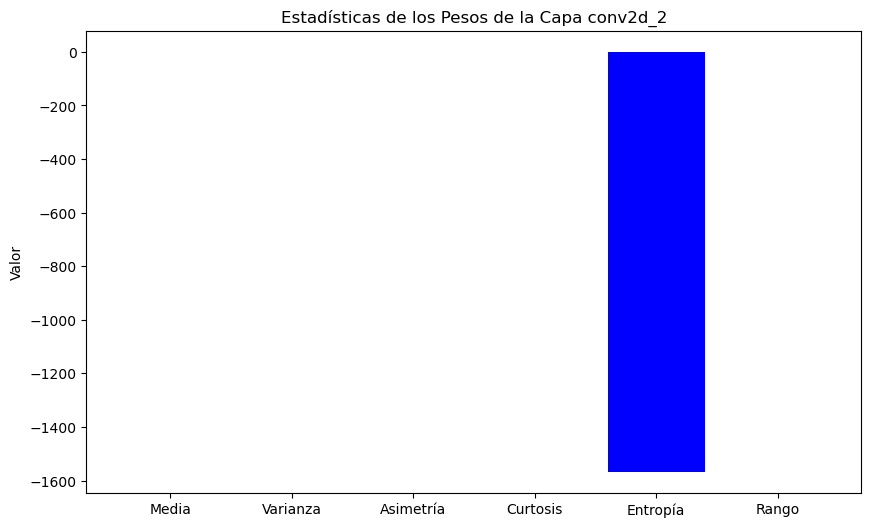

No se pueden calcular los pesos para la capa batch_normalization_3: too many values to unpack (expected 2)
No se pueden calcular los pesos para la capa re_lu_3: not enough values to unpack (expected 2, got 0)
No se pueden calcular los pesos para la capa max_pooling2d_2: not enough values to unpack (expected 2, got 0)
No se pueden calcular los pesos para la capa global_average_pooling2d: not enough values to unpack (expected 2, got 0)
Capa: dense
  Media: -0.001481230603531003
  Varianza: 0.007484381087124348
  Asimetría: 0.020010937911905478
  Curtosis: -0.7273994757417355
  Entropía: -764.8694513661258
  Rango: 0.5151617527008057


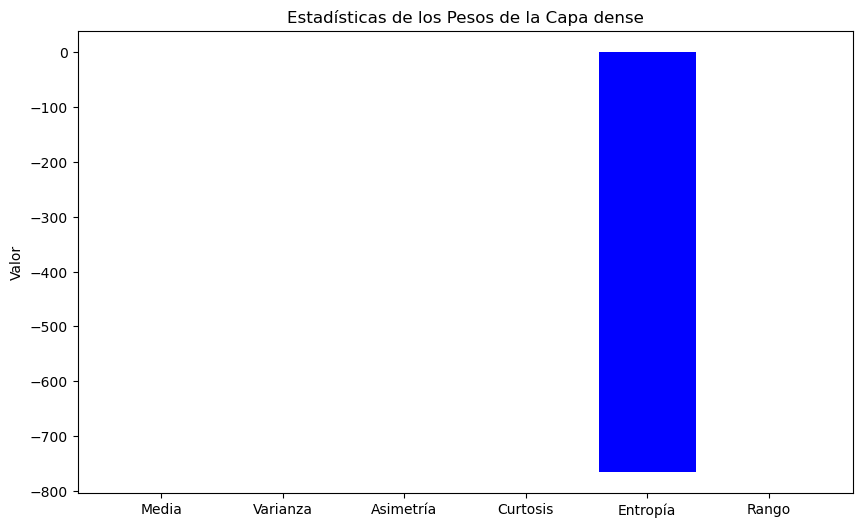

No se pueden calcular los pesos para la capa dropout: not enough values to unpack (expected 2, got 0)
Capa: dense_1
  Media: -0.05333375930786133
  Varianza: 0.08528409898281097
  Asimetría: -0.8554460468944954
  Curtosis: 0.5072299775369489
  Entropía: -16.720576331274444
  Rango: 1.645228624343872


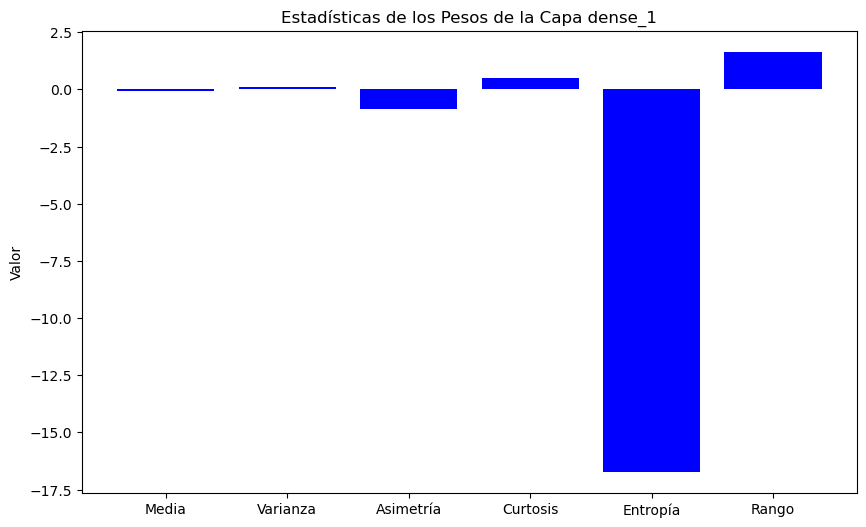

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from scipy.stats import kurtosis, skew
import cv2
import os
from sklearn.model_selection import train_test_split


# Modelo original
model_input = model.input
layer_outputs = [layer.output for layer in model.layers]  # Obtenemos las salidas de todas las capas
activation_model = Model(inputs=model_input, outputs=layer_outputs)  # Modelo para activaciones

# Escoge una imagen del conjunto de entrenamiento para visualizar
img = imagenes_train[0]  # Puedes cambiar el índice para seleccionar otras imágenes
img = img.reshape(1, 224, 224, 3)  # Cambia el tamaño según la entrada del modelo

# Obtener las activaciones de todas las capas
activations = activation_model.predict(img)

# Visualizar activaciones para cada capa
images_per_row = 8

for layer_name, layer_activation in zip([layer.name for layer in model.layers], activations):
    print(f"Visualizando activaciones para la capa: {layer_name}")
    
    if len(layer_activation.shape) == 4:  # Si la salida es 4D (batch_size, height, width, channels)
        n_features = layer_activation.shape[-1]  # Número de filtros en la capa
        size_y, size_x = layer_activation.shape[1], layer_activation.shape[2]  # Tamaños espaciales

        n_cols = n_features // images_per_row  # Número de columnas para organizar los gráficos
        display_grid = np.zeros((size_y * n_cols, images_per_row * size_x))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row]
                channel_image -= channel_image.mean()  # Normalizar para mejorar la visualización
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size_y : (col + 1) * size_y,
                             row * size_x : (row + 1) * size_x] = channel_image

        # Visualizar el grid de activaciones
        scale = 1.0 / size_y
        plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()
    
    elif len(layer_activation.shape) == 2:  # Si la salida es 2D (batch_size, features)
        plt.figure(figsize=(10, 4))
        plt.title(f"Activaciones de la capa {layer_name}")
        plt.plot(layer_activation[0])
        plt.show()

    else:
        print(f"No se puede visualizar la activación de la capa {layer_name} de dimensión {len(layer_activation.shape)}")

# Visualización de pesos para todas las capas
for layer in model.layers:
    try:
        pesos, sesgos = layer.get_weights()

        # Número de filtros en la capa
        num_filtros = pesos.shape[-1]

        # Tamaño del grid para visualizar los filtros
        grid_size = int(np.ceil(np.sqrt(num_filtros)))

        # Visualizar los filtros
        fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
        for i in range(num_filtros):
            filtro = pesos[:, :, 0, i]  # Extrayendo el filtro
            ax = axes[i // grid_size, i % grid_size]
            ax.imshow(filtro, cmap='viridis', aspect='auto')
            ax.axis('off')
        plt.suptitle(f'Pesos de la capa {layer.name}')
        plt.show()
    except:
        # Algunas capas pueden no tener pesos, como MaxPooling2D
        continue

# Cálculo y visualización de estadísticas de pesos para todas las capas
def calcular_entropia(pesos):
    hist, _ = np.histogram(pesos, bins=256, density=True)
    hist += 1e-7  # Evitar log(0)
    return -np.sum(hist * np.log2(hist))

for layer in model.layers:
    try:
        pesos, _ = layer.get_weights()

        # Calcular estadísticas
        media = np.mean(pesos)
        varianza = np.var(pesos)
        asimetria = skew(pesos.flatten())
        curtosis_val = kurtosis(pesos.flatten())
        entropia = calcular_entropia(pesos)
        rango_val = np.ptp(pesos)

        # Mostrar las estadísticas
        print(f"Capa: {layer.name}")
        print(f"  Media: {media}")
        print(f"  Varianza: {varianza}")
        print(f"  Asimetría: {asimetria}")
        print(f"  Curtosis: {curtosis_val}")
        print(f"  Entropía: {entropia}")
        print(f"  Rango: {rango_val}")

        # Graficar la evolución de las estadísticas
        estadisticas = ['Media', 'Varianza', 'Asimetría', 'Curtosis', 'Entropía', 'Rango']
        valores = [media, varianza, asimetria, curtosis_val, entropia, rango_val]

        plt.figure(figsize=(10, 6))
        plt.bar(estadisticas, valores, color='blue')
        plt.title(f'Estadísticas de los Pesos de la Capa {layer.name}')
        plt.ylabel('Valor')
        plt.show()

    except Exception as e:
        print(f"No se pueden calcular los pesos para la capa {layer.name}: {e}")
        continue

